<a href="https://colab.research.google.com/github/Kim-TH-00/AI_lab/blob/main/AI_class_week5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torchaudio

print(torch.__version__)
print(torchaudio.__version__)

torch.random.manual_seed(0)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print(device)

2.8.0+cu126
2.8.0+cu126
cuda


In [2]:
import IPython
import matplotlib.pyplot as plt
from torchaudio.utils import download_asset

# SPEECH_FILE = download_asset("tutorial-assets/Lab41-SRI-VOiCES-src-sp0307-ch127535-sg0042.wav")
SPEECH_FILE = "/content/titanic_audio.mp3"

In [3]:
bundle = torchaudio.pipelines.WAV2VEC2_ASR_BASE_960H

print("Sample Rate:", bundle.sample_rate)

print("Labels:", bundle.get_labels())

Sample Rate: 16000
Labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


In [4]:
model = bundle.get_model().to(device)

print(model.__class__)

<class 'torchaudio.models.wav2vec2.model.Wav2Vec2Model'>


In [5]:
IPython.display.Audio(SPEECH_FILE)

In [6]:
waveform, sample_rate = torchaudio.load(SPEECH_FILE)
waveform = waveform.to(device)

if sample_rate != bundle.sample_rate:
    waveform = torchaudio.functional.resample(waveform, sample_rate, bundle.sample_rate)

/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/utils.py:213: UserWarning: In 2.9, this function's implementation will be changed to use torchaudio.load_with_torchcodec` under the hood. Some parameters like ``normalize``, ``format``, ``buffer_size``, and ``backend`` will be ignored. We recommend that you port your code to rely directly on TorchCodec's decoder instead: https://docs.pytorch.org/torchcodec/stable/generated/torchcodec.decoders.AudioDecoder.html#torchcodec.decoders.AudioDecoder.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchaudio/_backend/ffmpeg.py:88: UserWarning: torio.io._streaming_media_decoder.StreamingMediaDecoder has been deprecated. This deprecation is part of a large refactoring effort to transition TorchAudio into a maintenance phase. The decoding and encoding capabilities of PyTorch for both audio and video are being consolidated into TorchCodec. Please see https://github.com/pytorch/audio/issues/3902 for more information. It will be r

In [7]:
with torch.inference_mode():
    features, _ = model.extract_features(waveform)

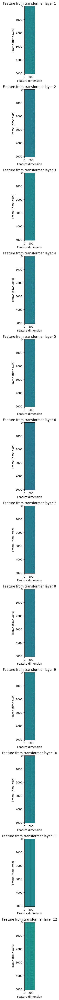

In [8]:
fig, ax = plt.subplots(len(features), 1, figsize=(16, 4.3 * len(features)))
for i, feats in enumerate(features):
    ax[i].imshow(feats[0].cpu(), interpolation="nearest")
    ax[i].set_title(f"Feature from transformer layer {i+1}")
    ax[i].set_xlabel("Feature dimension")
    ax[i].set_ylabel("Frame (time-axis)")
fig.tight_layout()

In [9]:
with torch.inference_mode():
    emission, _ = model(waveform)

Class labels: ('-', '|', 'E', 'T', 'A', 'O', 'N', 'I', 'H', 'S', 'R', 'D', 'L', 'U', 'M', 'W', 'C', 'F', 'G', 'Y', 'P', 'B', 'V', 'K', "'", 'X', 'J', 'Q', 'Z')


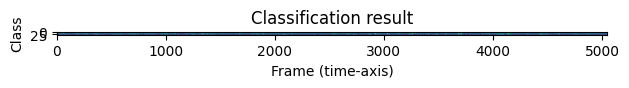

In [10]:
plt.imshow(emission[0].cpu().T, interpolation="nearest")
plt.title("Classification result")
plt.xlabel("Frame (time-axis)")
plt.ylabel("Class")
plt.tight_layout()
print("Class labels:", bundle.get_labels())

In [11]:
class GreedyCTCDecoder(torch.nn.Module):
    def __init__(self, labels, blank=0):
        super().__init__()
        self.labels = labels
        self.blank = blank

    def forward(self, emission: torch.Tensor) -> str:
        """Given a sequence emission over labels, get the best path string
        Args:
          emission (Tensor): Logit tensors. Shape `[num_seq, num_label]`.

        Returns:
          str: The resulting transcript
        """
        indices = torch.argmax(emission, dim=-1)  # [num_seq,]
        indices = torch.unique_consecutive(indices, dim=-1)
        indices = [i for i in indices if i != self.blank]
        return "".join([self.labels[i] for i in indices])

In [12]:
decoder = GreedyCTCDecoder(labels=bundle.get_labels())
transcript = decoder(emission[0])

In [13]:
print(transcript)
IPython.display.Audio(SPEECH_FILE)

|HOW|DO|YOU|D|WOOK|AVE|IS|LOOK|HAVE|YRE|FOR|ME|THANKS|NEVER|DID|LIKE|IT|MUCH|AND|WHYARE|EXACTLY|DO|YOU|LIV|MISTER|DALLSAN|WELL|WRIGHT|NOW|MY|ADDRESS|IS|THE|ARMES|TITANIC|AFTER|THAT|A'MON|GOD'S|GOOD|HUMOR|AND|HOW|IS|IT|YOU|HAVE|MEANS|TO|TRANTLE|I|WORKED|MY|WAY|FROM|PLACE|TO|PLACE|YOU|KNOW|TRAMP|STEAMERS|AND|SUCH|BUT|I|WANT|MY|TAKIT|ON|TITANIC|HERE|AND|A|LUCKY|HANDED|POKER|A|VERY|LUCKY|HAND|OH|LIFE|THROS|A|GAME|OF|LUCK|A|REAR|MAM|MAKES|HIS|OWN|PROATR|A|DOS|AND|YOU|FIND|THAT|SORT|OF|OTNESS|EXISTENCE|A|PEALING|TO|YOU|EL|YES|MA'AM|I|DO|I|MEAN|GOT|EVERYTHING|I|NEED|WRITE|HERE|WITH|ME|GOT|ARE|IN|MY|LUNGS|AND|FEW|BLANK|SHEETS|OF|PAPER|MAY|I|LOVE|WAKING|UP|IN|THE|MORNING|NOT|KNOWING|WHAT'S|CAN|HAPPENER|WHO|I'M|GOING|TO|MEET|WHERE|I'M|IN|A|WIND|UP|JUST|EITHER|NIGHT|I|WAS|SLEEPING|UNDER|BRIDGE|AU|NOW|HERE|I|AM|ON|THE|GRANDISHIP|IN|THE|WORLD|HAVING|CHAMPAGNE|WITH|YOU|FIND|PEOPLE|A||NIGHT'S|MO|A|FIGURE|LIFE'S|O|GIFT|NOT|ON|INTEND|ON|WASTING|IT|HO|NEVER|KNOW|WHAT|HAND|ARE|GING|TO|GET|DELL|NEXT|YOU'L